# Детекция обьектов на изображении

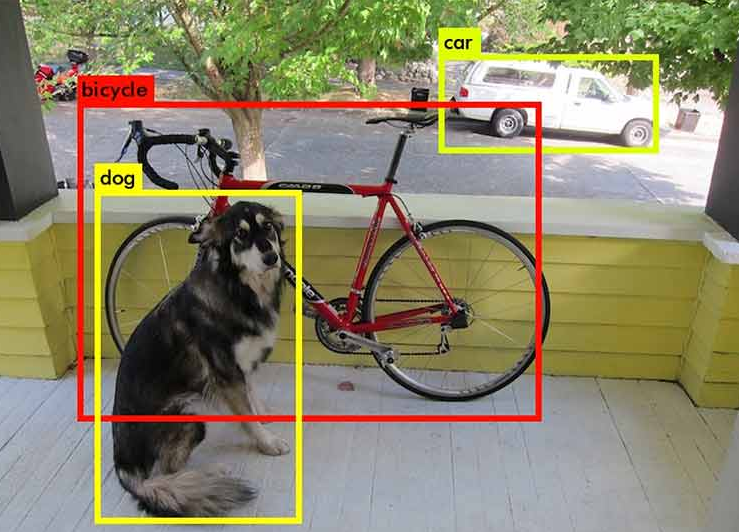

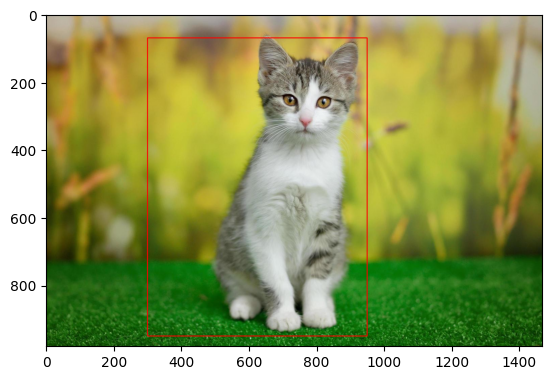

In [74]:
import cv2
import matplotlib.pyplot as plt

image = cv2.imread('assets/lesson3/1.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

image = cv2.rectangle(image, (300, 70), (950, 950), (255, 0, 0), 2)
plt.imshow(image)

## Как считать качество модели детекции?

### Intersection over union (IOU)

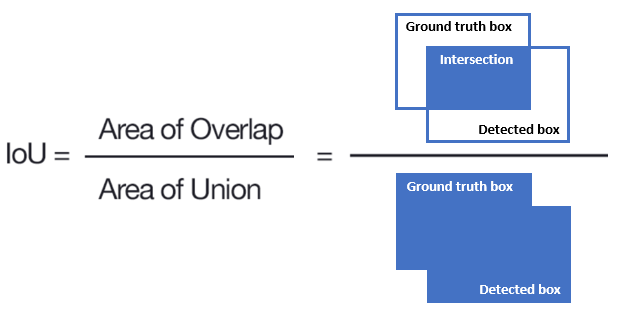

In [73]:
import numpy as np

box1 = np.array([0, 0, 50, 50])
box2 = np.array([25, 25, 50, 50])

box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])


intersection = np.array([
    max(box1[0],box2[0]),
    max(box1[1],box2[1]),
    min(box1[2],box2[2]),
    min(box1[3],box2[3]),
])
intersection_area = (intersection[2] - intersection[0]) * (intersection[3] - intersection[1])
union_area = box1_area + box2_area - intersection_area

iou = intersection_area / union_area

iou

0.25

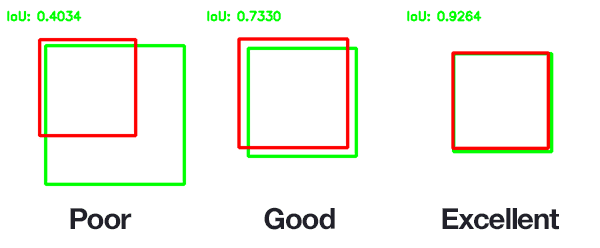

### Generalized intersection over union (gIOU)



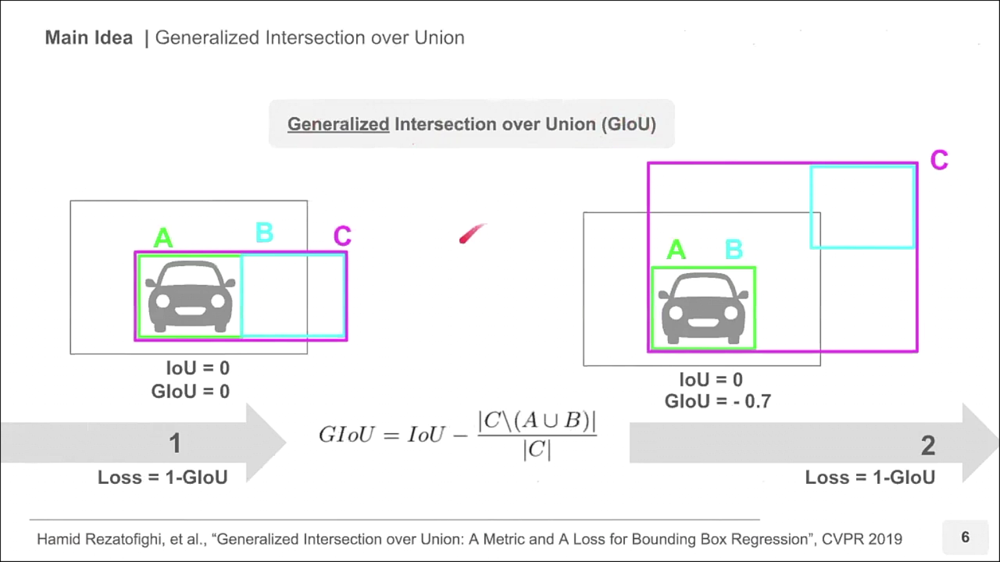

In [21]:
import numpy as np

box1 = np.array([0, 0, 50, 50])
box2 = np.array([25, 25, 75, 75])

box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])


intersection = np.array([
    max(box1[0],box2[0]),
    max(box1[1],box2[1]),
    min(box1[2],box2[2]),
    min(box1[3],box2[3]),
])
convex = np.array([
    min(box1[0],box2[0]),
    min(box1[1],box2[1]),
    max(box1[2],box2[2]),
    max(box1[3],box2[3]),
])
intersection_area = (intersection[2] - intersection[0]) * (intersection[3] - intersection[1])
convex_area = (convex[2] - convex[0]) * (convex[3] - convex[1])
union_area = box1_area + box2_area - intersection_area

iou = intersection_area / union_area
giou = iou - (convex_area - union_area) / convex_area

iou, giou

(0.14285714285714285, -0.07936507936507936)

### Матрица ошибок для детекции

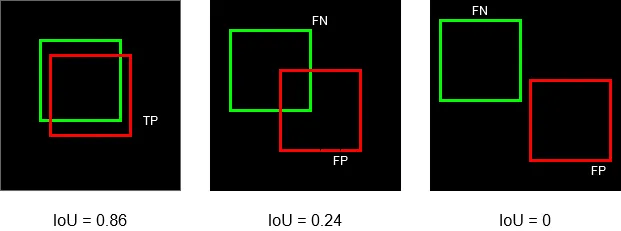

Каждая детекция, которая не пересекается ни с одним GT боксом - FP, если пересекается, то TP. Каждый GT бокс, который не пересекается ни с одной детекцией - FN.

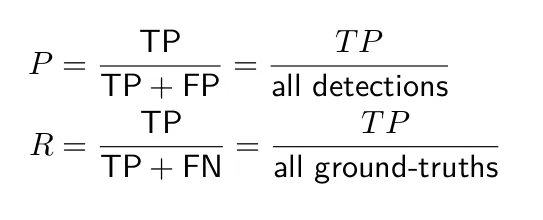

### Average precision (AP)
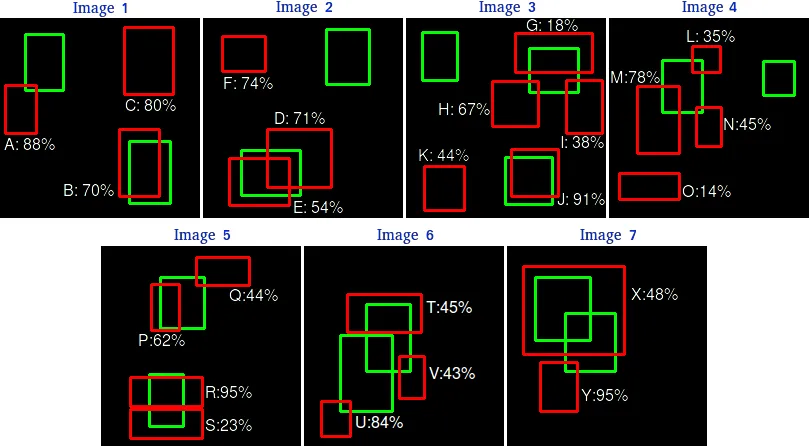
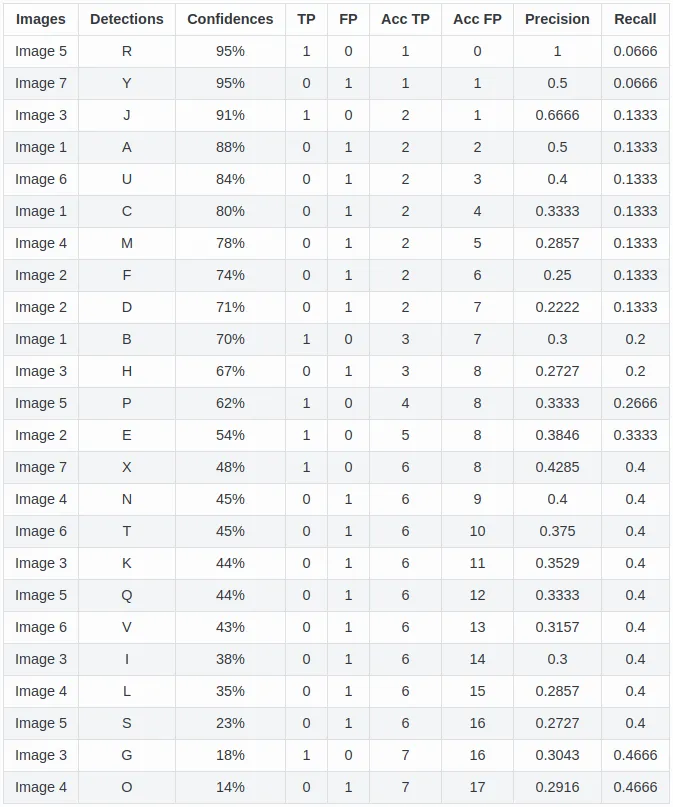
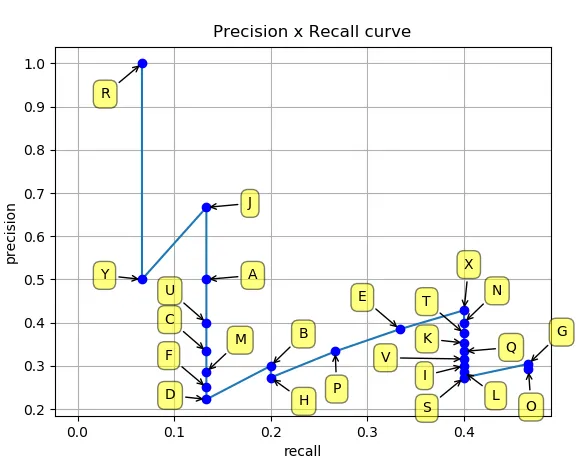

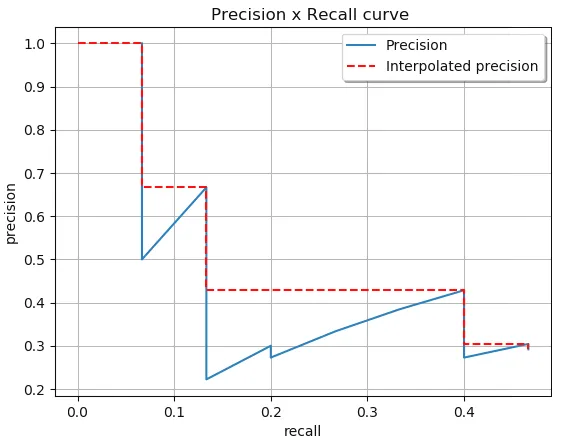

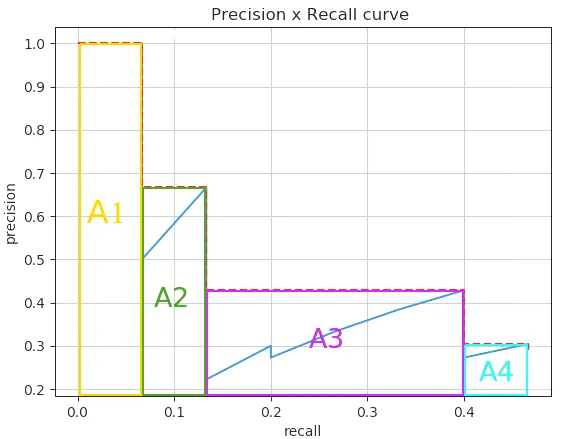

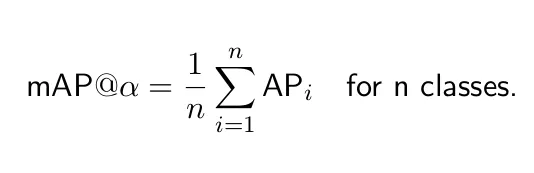

## Архитектуры детекторов

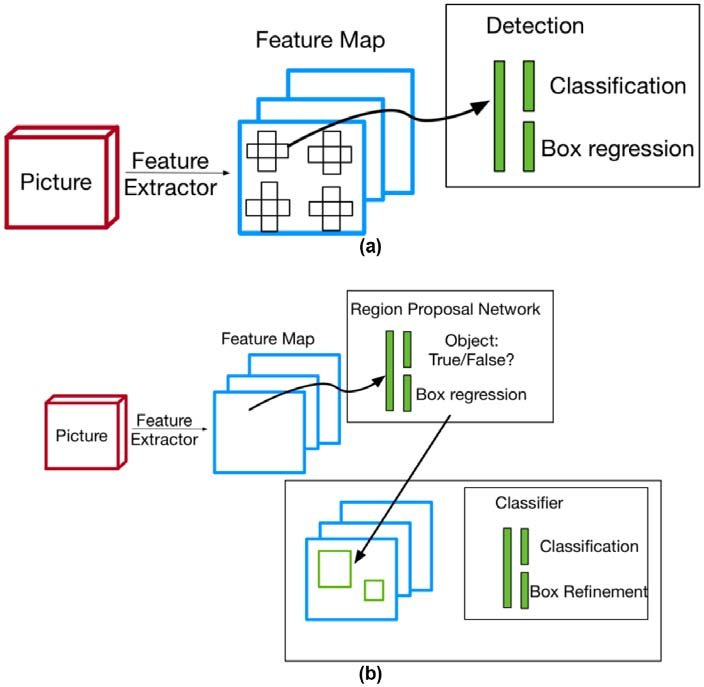

### Немного о двухстадийных детекторах

#### RCNN

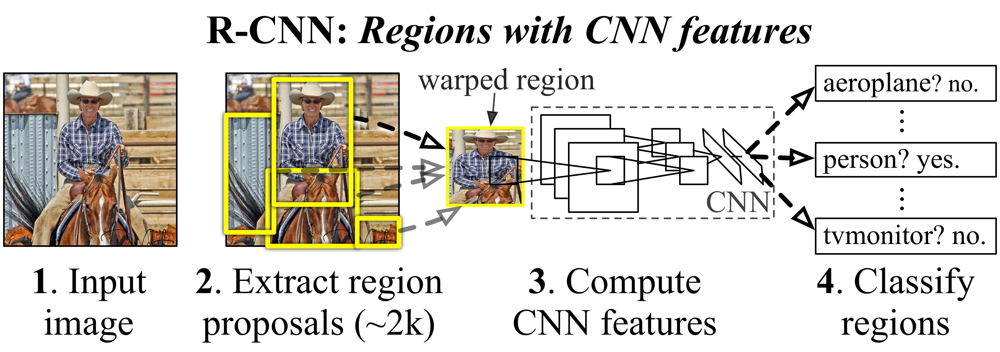

#### Fast RCNN

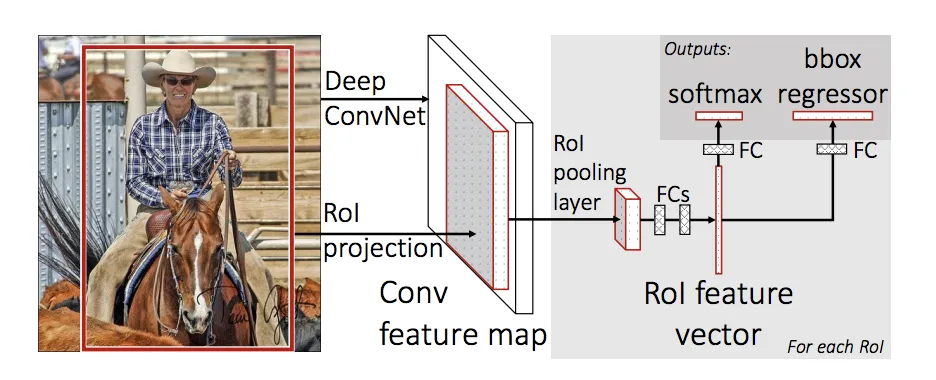

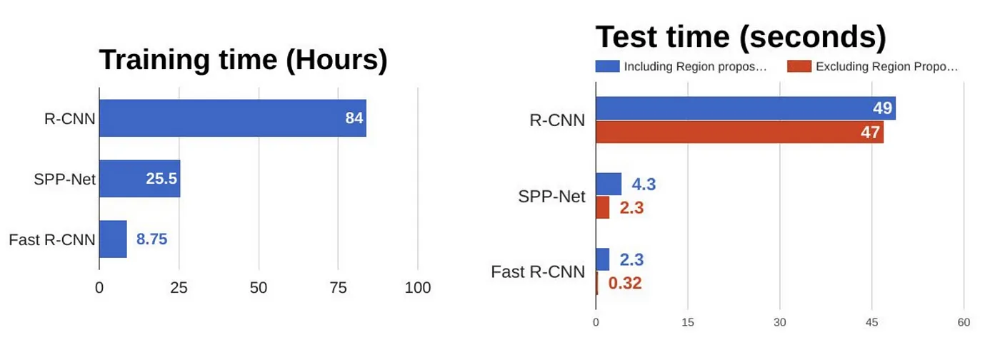

#### Faster RCNN

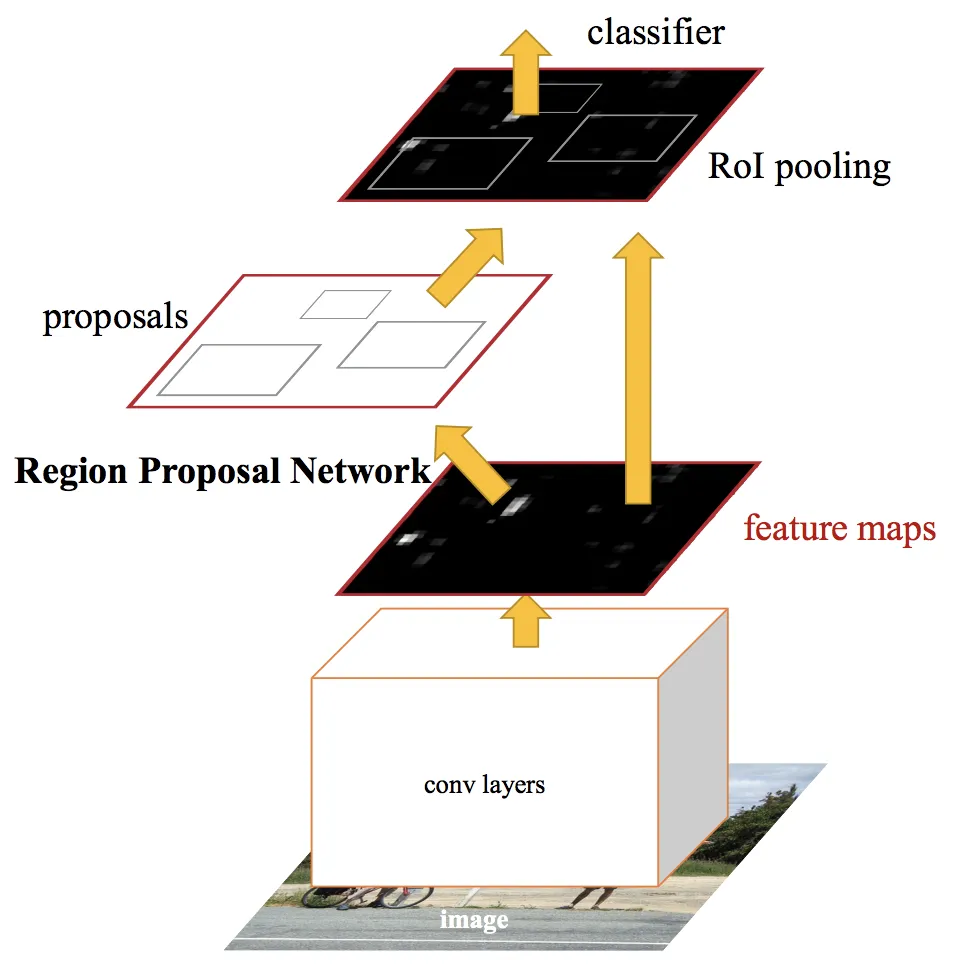

### Одностадийные детекторы

#### YOLO

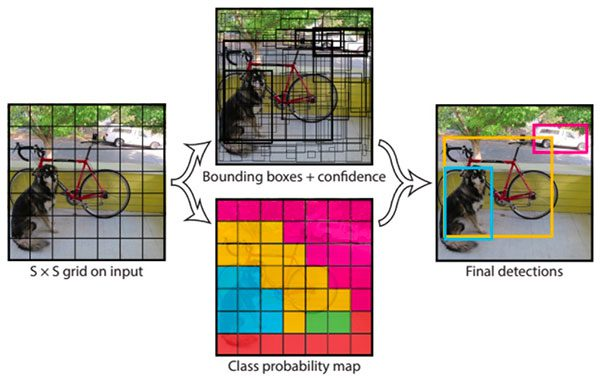

#### SSD

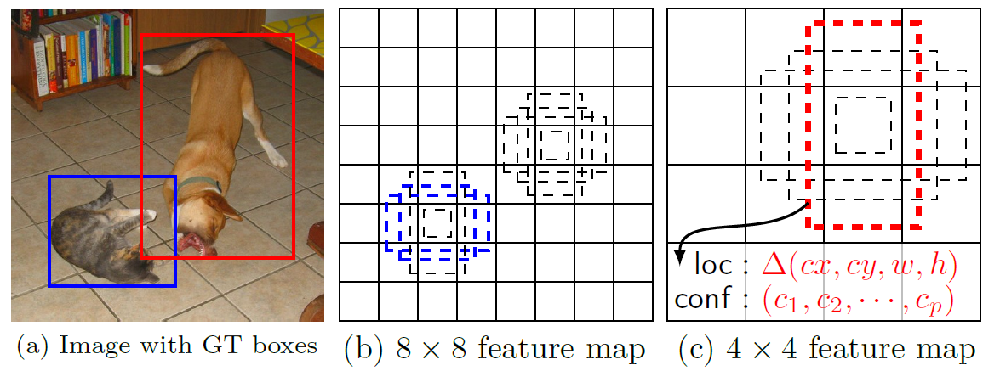

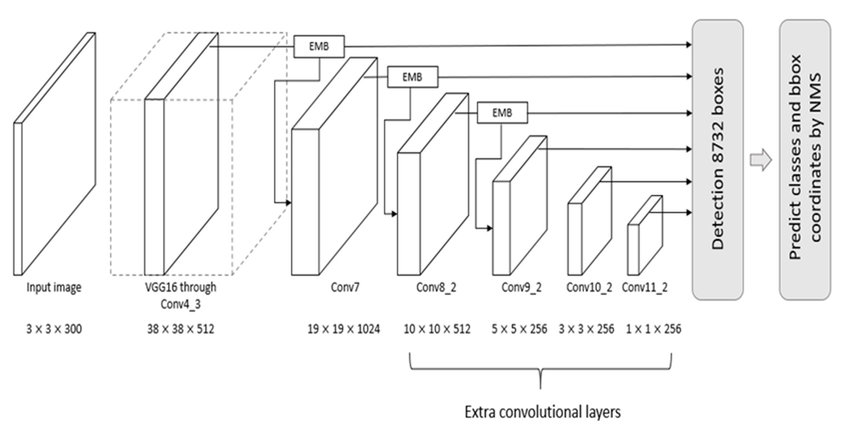

#### Retinanet

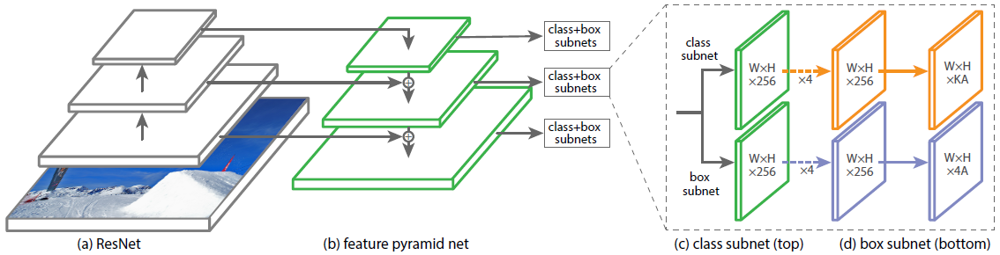

#### YOLOv3

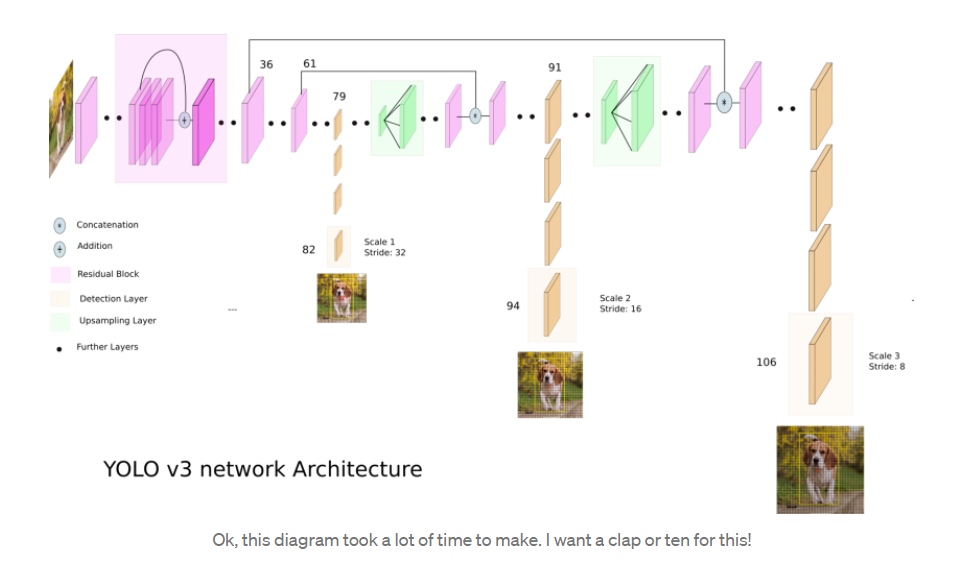

- Используют Darknet53 (просто по сути FCN с 3х3 свертками + resudial block).
- Используют аналогию FPN.
- Каждая ячейка фичи мапы (13х13, и тд) по-сути работает с 3 якорями. Таким образом размер будет равен 3 * (4 + 1 + число классов).
- Стоит отметить, что позитивные боксы (для которых будет считаться регрессия) считаются только те, что имеют маскимальный iou с GT и центр которых лежит в соответствующей ячейке. По-сути мы выбираем ближайшие якоря из ближних ячеек.

#### YOLOv4

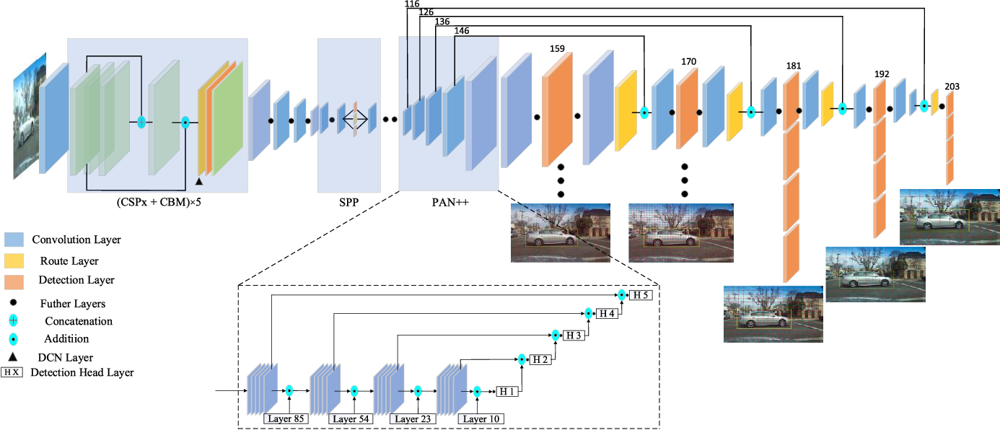

- Используют CSPDarknet53 - модификацию darknet, которая по-сути состоит из множетсва слоев (примерно 100, в основном все свертки 3х3) и блок от CSPNet. Блок CSP по-сути делит входные фичи на 2 части (размер частей регулируется) и одну часть отправляет на блок, а вторую пробрасывает на выход блока.
- Добавили блоки SPP и PAN в neck часть сети. Первый по-сути увеличивает рецептивное поле методом конкатенации результатов нескольких параллельных пуллингов по фича мапе и просто может добавиться как допполнительный блок. PAN блок расширяет FPN пирамиду дополнительным аналогичным проходом сверху вниз (однако вместе суммы между разными фичами делает конкатенацию).
- Используют голову от YoloV3
- Используют катмикс, мозайки, dropblock регуляризацию, и label smoothing. В классификации бэкбона используют Mish активации, CSP блоки. В детекции используют CIoU-loss, несколько якорей для одного GT, DIoU-NMS.

#### FCOS

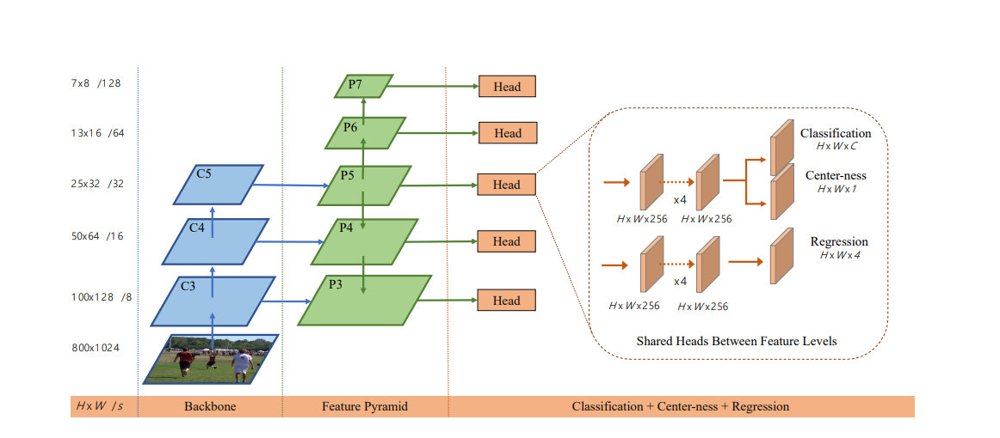

- Обычная FCN сеть, которая изначально смотрит на бокс, как на сегментацию (с точки зрения классификации). Если пиксель внутри какого-то бокса, то этот пискель равен 1 (по классам, типо multilabel), иначе 0. Регрессия же это расстояние от точки до рамок (4 числа, как обычно). Если точка попала в несколько боксов, то таргетом считается тот, что меньше. Лосс является суммой лоссов классификации и регрессии только для тех точек, которые попали хотя бы в один бокс
- Использует FPN блок для multi-scale подхода в разрешении неопределенностей (когда точка принадлежит нескольким боксам) и когда у нас высокий одиночный страйд (который может понизить BPR - best positive recall, т.к. мы будет пропускать обьекты). На каждом фича левеле мы рассмаотриваем только те регресии точек, для которых максимальный размер (по 4м измерениям) лежит в интервале максимальных размеров для этого фича левела. Т.к. задача регрессии для каждого фича левела разная (разные интервалы), то логично использовать разные головки (что и делают авторы). Они вместо exp(x) рассмаотривают exp(s_i * x) для регрессии, где s_i - обучаемый, для каждого слоя свой. Итого добавлено FPN блок + фильтр по размерам регресии + множество головок для решения задачи в каждом левеле + адаптивные коэффициенты для регресии на разных уровнях.
- Параллельно classification head добавили одноканальный слой, который предсказывает centerness. Он предсказывает степень дальности точки от центра (чем больше расходится left и right или top и down в регрессии, тем меньше этот скор). Этот показатель варьируется от 0 и 1 и обучается на BCELoss. В итоге этот показатель используется для фильтрации "плохих" боксов методом умножения на вероятность класса этого скора.

#### YOLOX

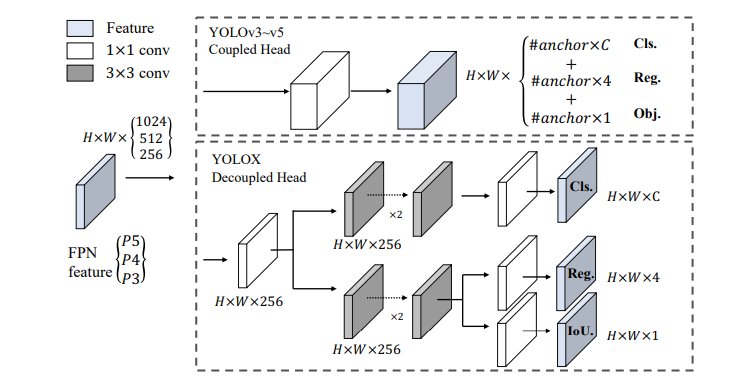

- Используется Darkent53 + SPP блоки.
- Вместо Coupled головы (когда мы програнизируем все параметры 1 + 4 + число классов для каждого анкора) используется Decoupled (одна на классификацию, вторая на регрессию).
- Mixup + mosaic
- По-сути делают как в FCOS (выбор позитивного семпла и разные левелы фильтруют свои семплы)
- Если в FCOS выбирается только центральная точка сетки (пиксель на мапе по-сути), то в этой реализации решили брать карту пикселей 3х3 с соответствующим центром, чтобы избавится от дисбаланса позитивных и негативных семплов. Эти 8 дополнительных семпла могут дать полезные градиенты.
- Используется метод label assignment SimOTA. Этот метод позволяет выбирать позитивные семплы для каждого GT на всех предсказаниях (глобальность). Мы смотрим расстояние от GT до всех предсказания, выбираем top-k по сумме лоссов и считаем их позитивными (только те, что внутри центра GT). Для каждого GT значение k разное.

#### OTA

- Является методов фарма положительных семплов для GT.
- По сути на каждого анкора (точки на сетке) считается стоимость. Причем для каждого анкора может быть только один GT, каждый GT может иметь k акорово. Далее для каждого анкора опряделяются (с помощью алгоритма на матричных операциях, поэтому можно оптимизировать как лосс) анкоры, которые будем считать за положительные семплы. Для стабильного обучения (особенно вначале) важно выбирать только те анкоры, которые находятся внутри центральной части GT.
- Соответственно для каждого GT вычисляется k, пропорционально размеру, соотношению сторон. Он вычисляется следующим образом: берутся Q топовых предсказаний для этого GT и считается IOU для него. Суммарный IOU будет описывать k. Интуитивно: мы берем за k - число хорошо регрессируемых анкоров для заданного GT.

#### TPH-YOLOv5

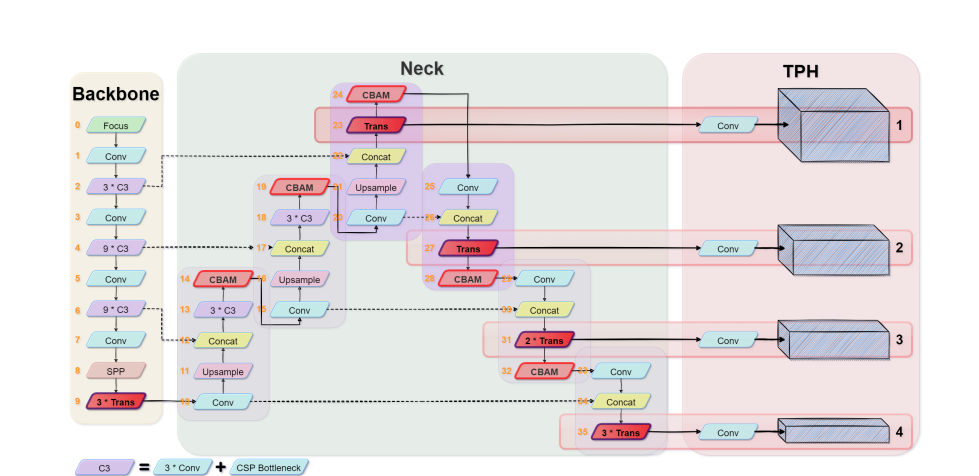

#### DETR

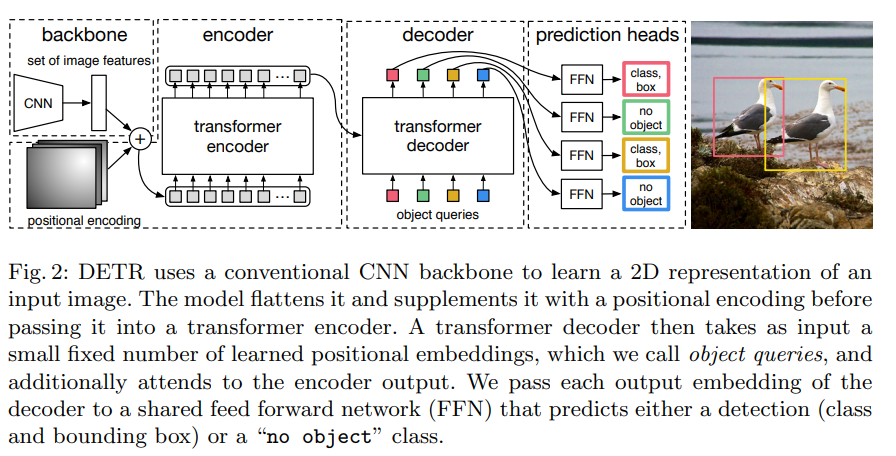

- Использует end2end подход. Сначала определяется функция ошибки: сопостовляются боксы и GT один к одному через лучшую перестановку. Далее эта перестановка используется для подсчета лосс функции (обычная сумма классификации и регресии для центра и размера).
- Архитектура сети следующая: сначала берутся фичи с CNN сети, дале подаем результат (reshaped to 1D from 2D) в encoder (с позиционным кодированием). Далее отправляем результат в декодер с также позиционным кодированием в виде object queries. Далее используется сеть прямого распростроеннния FFN для генерации боксов.

#### DINO

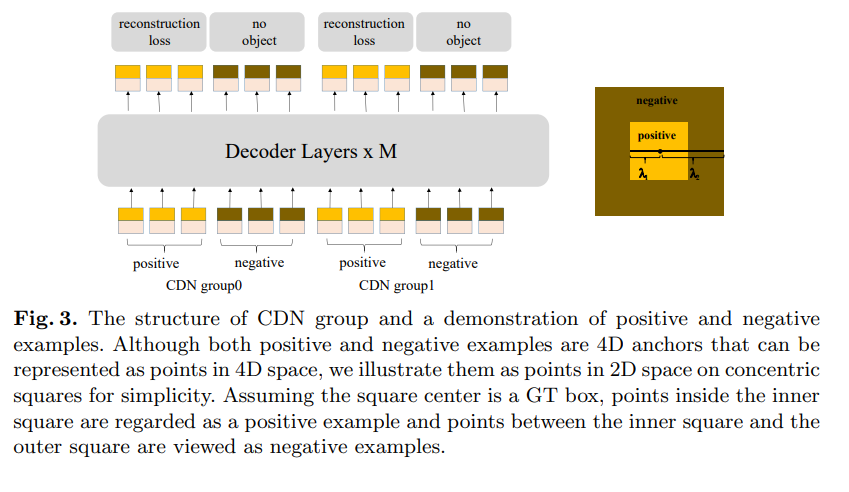

- Является усовершенствованием DETR
- В object queries решили взять якоря, таким образом метод становится achor-based. По сути эти якоря будут уточняться слой за слоем в докедере. Однако сами якоре инициализируются из query selection слоя, который принимает на вход результаты encoder.
- Так как DETR медленно сходится из-за query objects решили добавить зашумленные GT в query objects, чтобы учить декодер их восстанавливать. Однако эти якоря будут штрафоваться с помощью другой функции потери. Это хорошо стабилизирует обучение сети. Причем якоря могут сильно зашумлятся, тогда их можно будет считать негативным семплом.

## Аугментация - мастхев в задаче детекции

### Mixup

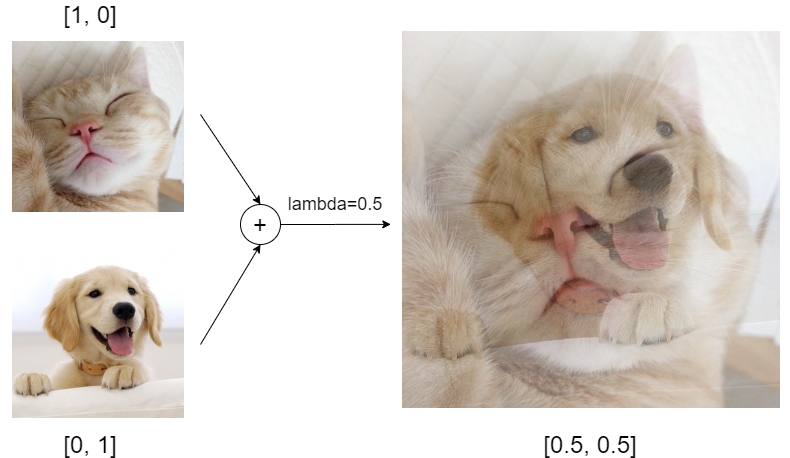

### Cutout

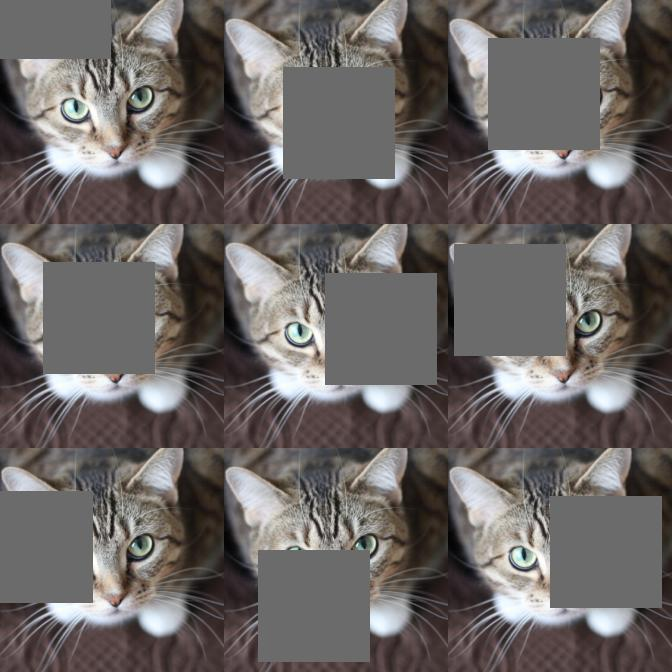

### Cutmix

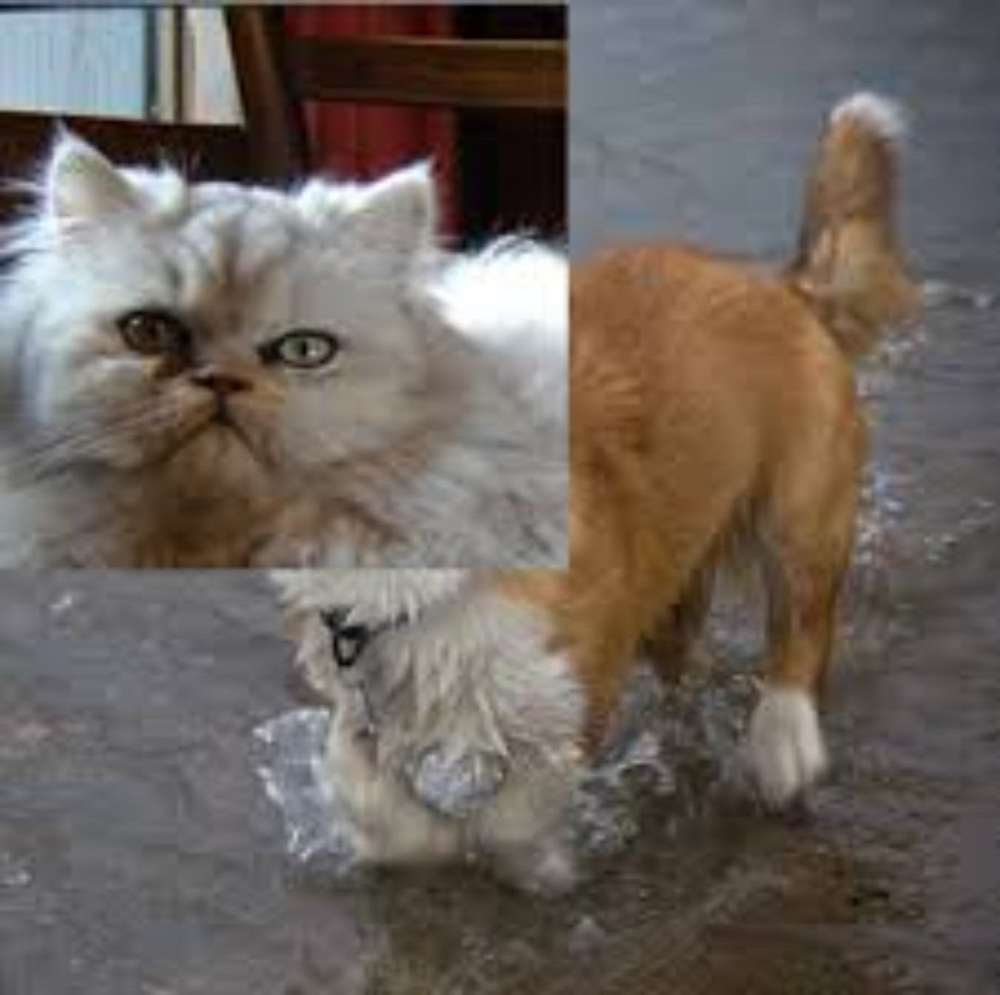

### А как вам такой Cutmix?
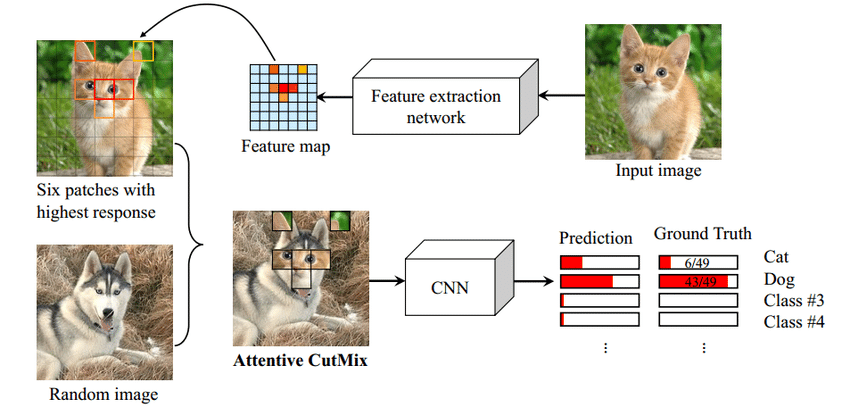

### Mosaic

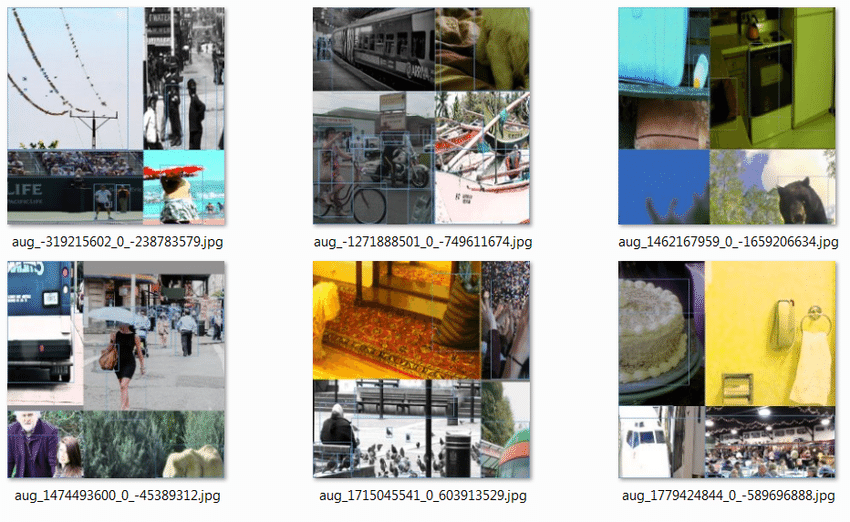

### Copy paste

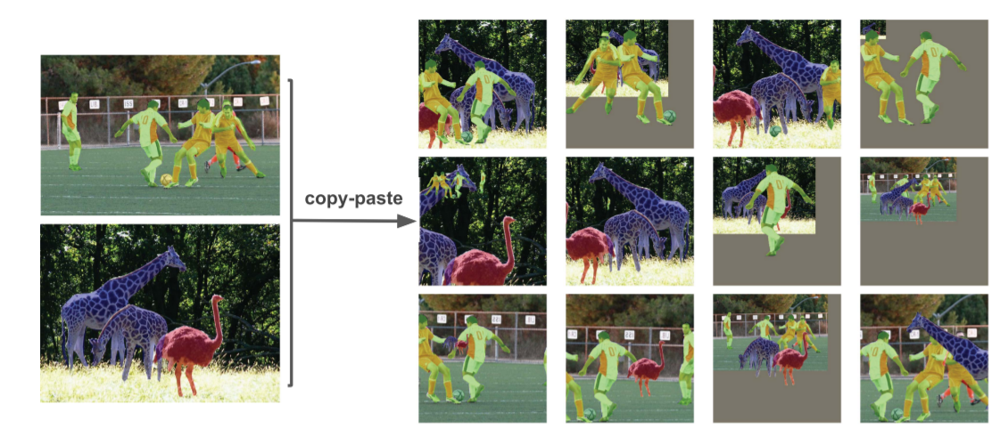

# Code time

In [75]:
from mmyolo import models
import mmengine

In [37]:
backbone = models.backbones.YOLOXCSPDarknet()
backbone

YOLOXCSPDarknet(
  (stem): Focus(
    (conv): ConvModule(
      (conv): Conv2d(12, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (activate): SiLU(inplace=True)
    )
  )
  (stage1): Sequential(
    (0): ConvModule(
      (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (activate): SiLU(inplace=True)
    )
    (1): CSPLayer(
      (main_conv): ConvModule(
        (conv): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (activate): SiLU(inplace=True)
      )
      (short_conv): ConvModule(
        (conv): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.0

In [38]:
neck = models.necks.YOLOXPAFPN(in_channels=[256, 512, 1024], out_channels=128)

In [79]:
head = models.dense_heads.YOLOXHead(
    dict(type='YOLOXHeadModule', num_classes=1, in_channels=128),
    test_cfg=mmengine.Config(
        dict(max_per_img=100,multi_label=True, nms_pre=1000, score_thr=0.01, nms=dict(type='nms', iou_threshold=0.45, class_agnostic=True))
    ),
    train_cfg=mmengine.Config(dict(assigner=dict(type='mmdet.SimOTAAssigner', center_radius=2.5))),
)

In [80]:
import torch

with torch.no_grad():
    features = backbone(torch.rand(1, 3, 640, 640))
    features = neck(features)
    cls_scores, box_preds, objectnesses = head.forward(features)

In [81]:
with torch.no_grad():
    results = head.predict_by_feat(cls_scores, box_preds, rescale=False, batch_img_metas=[dict(ori_shape=(640, 640, 3), scale_factor=(1.0, 1.0))])

results

[<InstanceData(
 
     META INFORMATION
 
     DATA FIELDS
     scores: tensor([0.9889, 0.9792, 0.9773, 0.9642, 0.9504, 0.9411, 0.9371, 0.9333, 0.9314, 0.9309, 0.9299, 0.9274, 0.9250, 0.9236, 0.9205, 0.9187, 0.9165, 0.9152, 0.9147, 0.9136, 0.9106, 0.9099, 0.9082, 0.9064, 0.9059, 0.9049, 0.9023, 0.9010, 0.9009, 0.8992, 0.8988, 0.8984, 0.8976, 0.8968, 0.8940, 0.8909, 0.8902, 0.8894, 0.8885,
                 0.8876, 0.8875, 0.8874, 0.8869, 0.8829, 0.8814, 0.8801, 0.8743, 0.8723, 0.8719, 0.8711, 0.8701, 0.8694, 0.8676, 0.8653, 0.8647, 0.8645, 0.8624, 0.8622, 0.8617, 0.8613, 0.8597, 0.8584, 0.8580, 0.8572, 0.8563, 0.8562, 0.8560, 0.8555, 0.8550, 0.8546, 0.8544, 0.8544, 0.8539, 0.8536, 0.8535, 0.8529, 0.8527, 0.8521,
                 0.8507, 0.8505, 0.8491, 0.8478, 0.8478, 0.8458, 0.8444, 0.8437, 0.8432, 0.8429, 0.8413, 0.8394, 0.8381, 0.8358, 0.8357, 0.8348, 0.8343, 0.8342, 0.8340, 0.8331, 0.8328, 0.8307])
     bboxes: tensor([[130.2122, 293.6428, 130.4495, 313.4375],
                 [133.

In [82]:
with torch.no_grad():
    losses = head.loss_by_feat(
        cls_scores, box_preds, objectnesses,
        torch.tensor([[0, 0, 10, 10, 20, 20]]),
        [dict(ori_shape=(640, 640, 3), scale_factor=(1.0, 1.0))]
    )

losses

{'loss_cls': tensor(0.7158),
 'loss_bbox': tensor(4.9975),
 'loss_obj': tensor(5830.7139)}

In [103]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

model = YOLO("yolov8l.pt")
results = model(cv2.imread('assets/lesson3/3.jpeg'))


0: 384x640 12 persons, 198.7ms
Speed: 1.7ms preprocess, 198.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


In [104]:
bboxes = results[0].boxes.xyxy.numpy().astype('int32').tolist()

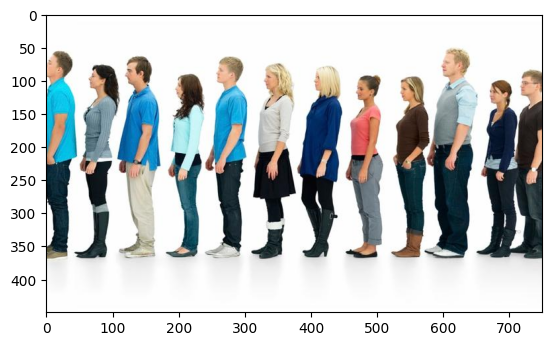

In [107]:
image = cv2.imread('assets/lesson3/3.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)

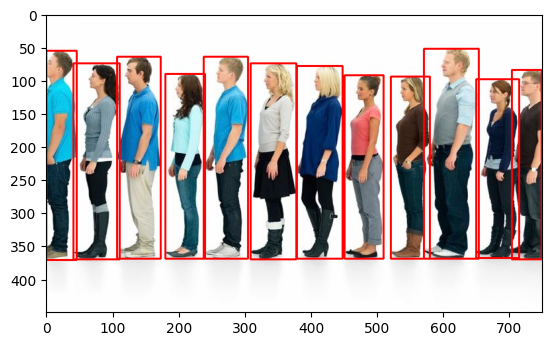

In [108]:
for box in bboxes:
    image = cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (255, 0, 0), 2)

plt.imshow(image)

In [109]:
bboxes

[[0, 55, 46, 371],
 [571, 52, 654, 369],
 [107, 64, 173, 369],
 [451, 92, 510, 369],
 [41, 74, 111, 370],
 [180, 90, 240, 369],
 [521, 94, 580, 369],
 [379, 78, 448, 369],
 [238, 64, 305, 369],
 [309, 74, 378, 370],
 [650, 98, 715, 368],
 [704, 84, 749, 370]]